In [66]:
%pylab inline
plt.rcParams["figure.figsize"] = (20,10)

Populating the interactive namespace from numpy and matplotlib


# Simulating an Arrow-robot

In [67]:
def draw_triangular_robot(x, y, theta, ax, scale=.1):
    # Define the vertices of a triangle
    vertices = np.array([[1, 0], [-0.5, 0.5], [-0.5, -0.5]])
    vertices*=scale

    # Rotate the triangle based on the provided theta
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                                [np.sin(theta), np.cos(theta)]])
    vertices = np.dot(vertices, rotation_matrix.T)

    # Translate the triangle to the specified (x, y) position
    vertices += np.array([x, y])

    # Close the triangle by repeating the first vertex
    vertices = np.vstack([vertices, vertices[0]])

    # Plot the triangular robot
    ax.plot(vertices[:, 0], vertices[:, 1], 'b-')
    ax.fill(vertices[:, 0], vertices[:, 1], color='lightblue')  # Fill the triangle with color
    
    
class Robot:
    def __init__(self, x=[0,0,0]):
        self.x = x
        self.x_log = [copy(x)]
    
    # Perfect sensor
    def sense(x):
        return self.x
        
    
    def draw(self, ax, scale=.1):
        x, y, theta = self.x
        draw_triangular_robot(x, y, theta, ax, scale)
        
        
    
    
    def simulate(self, Δt=0.1):
        v, omg = self.control(-1)
        dx = array([v * cos(self.x[2]), v * sin(self.x[2]), omg])
        # Euler integration
        self.x += Δt * dx
        # Log
        self.x_log.append(copy(self.x))

    def control(t, y):
        ### WRITE YOUR CONTROL POLICY HERE:
        v, omg = 1, 1
        return array([v, omg])

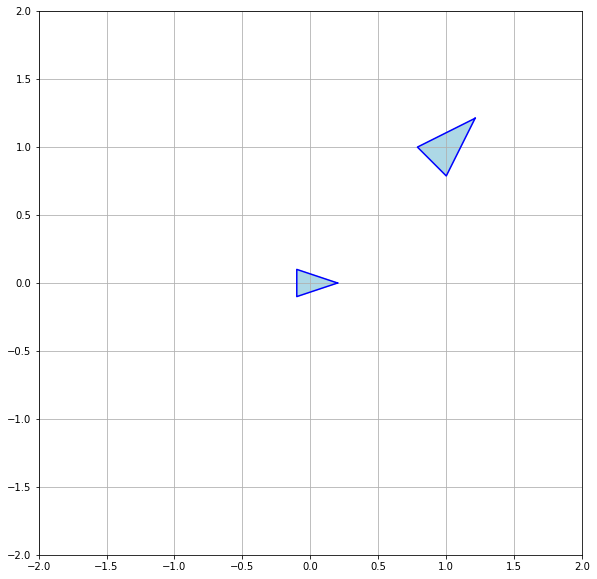

In [75]:
r1 = Robot()
r2 = Robot([1,1,pi/4])

# Example usage:
fig, ax = plt.subplots()
ax.set_xlim([-2, 2])
ax.set_ylim([-2, 2])
ax.set_aspect('equal')
ax.grid()
r1.draw(ax,.2)
r2.draw(ax,.3)

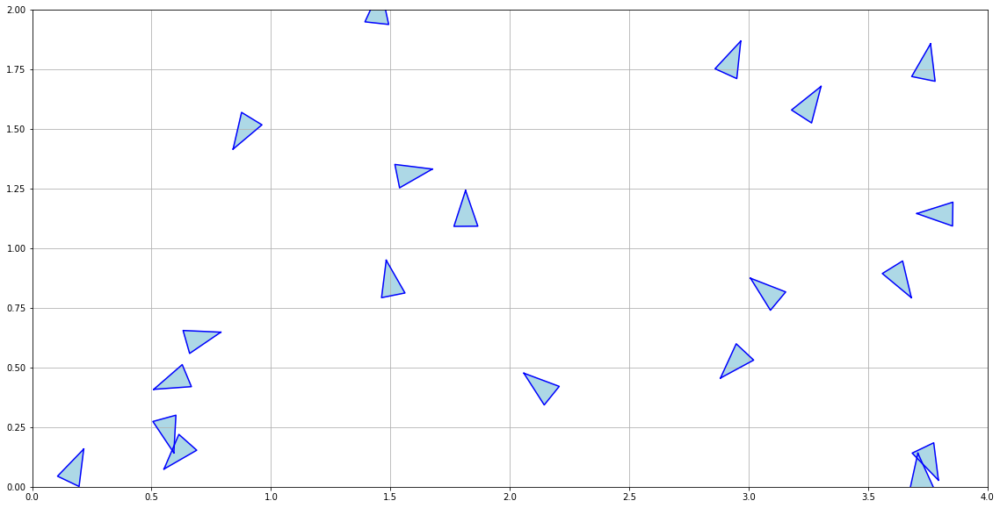

In [78]:
n=20  # Number of robots
X0s = np.random.rand(n,3)  # initial conditions
X0s[:,0] *= 4
X0s[:,1] *= 2
X0s[:,2] *= 2*pi

# Robots
robots = [Robot(x0) for x0 in X0s]


# Visualization:
fig, ax = plt.subplots()
ax.set_xlim([0, 4])

ax.set_ylim([0, 2])
ax.set_aspect('equal')
ax.grid()

for r in robots:
    r.draw(ax)

### Running the simulator

In [79]:
tf = 9.
Δt = 0.1    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval



# Run the robots for some time
for t in time:    
    for r in robots:
        r.simulate()

for r in robots:
    r.x_log = array(r.x_log)
    
    


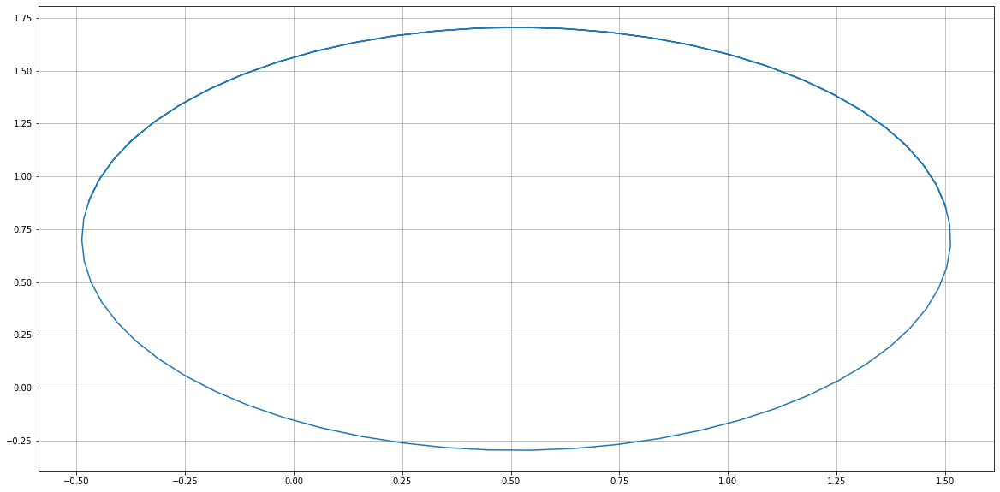

In [80]:
grid()
plot(r.x_log[:,0], r.x_log[:,1])

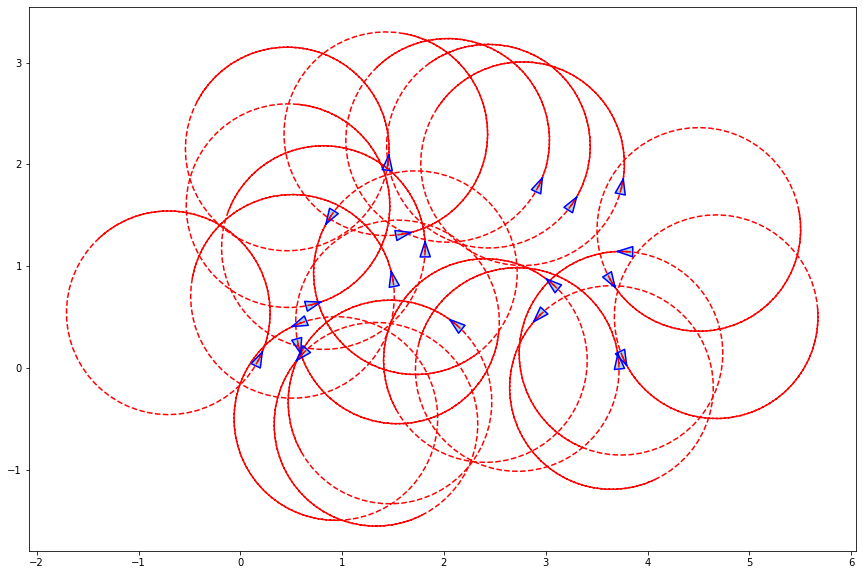

In [81]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()
ax.set_aspect('equal')
def animate(t):
    ax.clear()
    
    
    # Paths
    for r in robots:            
        plot(r.x_log[:,0], r.x_log[:,1], 'r--')
    
    # Initial conditions
#     plot(x_log[t,0], x_log[t,1], 'bo')
    for r in robots:        
        draw_triangular_robot(x=r.x_log[t,0], y=r.x_log[t,1], theta=r.x_log[t,2], ax=ax)

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())